In [41]:
# Lab settings - please ingnore
options(repr.plot.width=7, repr.plot.height=4, repr.plot.res=250 ) # Make plots a resonable size

<div class="big_title">LAB 9: Mapping and geospatial analysis</div>

BIO3782: Biologist's Toolkit (Dalhousie University)

----------------------------------------

# Setup of workspace

<span class="important"></span> Make sure all required files are in the working directory:

* Create a **folder** on the "Desktop" and name it <span class='file'>Lab9</span>.
* Create a sub folder called <span class='file'>raw_data</span>.
* From Brightspace, download the following files into your folder <span class='file'>Desktop\Lab9\</span> folder:
   * <span class="file">NEON-DS-Airborne-Remote-Sensing Folder</span>
   
* In RStudio, change the "working directory" to: <span class='file'>Desktop\Lab9</span>. Click here if you need a [refresher on the **working directory**](https://diego-ibarra.github.io/biol3782/week1/index.html#RStudio's-%22Working-Directory%22)

* In RStudio, create a new R script, name it <span class='file'>lab9.r</span> and make sure you save it in <span class='file'>Desktop\Lab9</span>. You will be writting and copy-pasting code to your <span class='file'>lab9.r</span> file so that you can keep a record of all you did in this lab.

As in previous labs, we'll try simulate "real-life" coding, by using the tags below to indicate when to use RStudio's <span class="editor"></span> or <span class="console"></span>
<br>
<div class="use_editor"></div>    
<br>
<div class="use_console"></div>    
<br> 

<span class="important"></span> Make sure you check your data, using both summaries (i.e. str(), dim()) and raw data, when you import/load it **and** after any manipulation.

----------------------------------


# What is Raster data?

In its simplest form, a raster consists of a matrix of cells (or pixels) organized into rows and columns (or a grid) where each cell contains a value representing information, such as temperature. The cell values represent the phenomenon portrayed by the raster dataset such as a category, magnitude, height, or spectral value. The category could be a land-use class such as grassland, forest, or road. A magnitude might represent gravity, noise pollution, or percent rainfall. Height (distance) could represent surface elevation above mean sea level, which can be used to derive slope, aspect, and watershed properties. Spectral values are used in satellite imagery and aerial photography to represent light reflectance and color.

Cell values can be either positive or negative, integer, or floating point. Integer values are best used to represent categorical (discrete/thematic) data and floating-point values to represent continuous surfaces. 

The major use of raster data involves storing map information as digital images, in which the cell values relate to the pixel colours of the image. To reproduce the image the computer reads each of these cell values one by one and applies them to the pixels on the screen.
<br>
<img src="raster.png">
<br>

Rasters are stored as an ordered list of cell values, for example, 80, 74, 62, 45, 45, 34, and so on. The area (or surface) represented by each cell consists of the same width and height and is an equal portion of the entire surface represented by the raster. For example, a raster representing elevation (that is, digital elevation model) may cover an area of 100 square kilometers. If there were 100 cells in this raster, each cell would represent 1 square kilometer of equal width and height (that is, 1 km x 1 km).
<br>
<img src="rastertheory.png">
<br>
The dimension of the cells can be as large or as small as needed to represent the surface conveyed by the raster dataset and the features within the surface, such as a square kilometer, square foot, or even square centimeter. The cell size determines how coarse or fine the patterns or features in the raster will appear. The smaller the cell size, the smoother or more detailed the raster will be. However, the greater the number of cells, the longer it will take to process, and it will increase the demand for storage space. If a cell size is too large, information may be lost or subtle patterns may be obscured. For example, if the cell size is larger than the width of a road, the road may not exist within the raster dataset. The location of each cell is defined by the row or column where it is located within the raster matrix. Essentially, the matrix is represented by a Cartesian coordinate system, in which the rows of the matrix are parallel to the x-axis and the columns to the y-axis of the Cartesian plane. Row and column values begin with 0. In the example below, if the raster is in a Universal Transverse Mercator (UTM) projected coordinate system and has a cell size of 100, the cell location at 5,1 would be 300,500 East, 5,900,600 North.In the diagram below, you can see how this simple polygon feature will be represented by a raster dataset at various cell sizes.
<br>
<img src="poly.png">
<br>
While the structure of raster data is simple, it is exceptionally useful for a wide range of applications. Within a GIS, the uses of raster data fall under four main categories:

Data stored in a raster format represents real-world phenomena:

* Thematic data (also known as discrete) represents features such as land-use or soils data.
* Continuous data represents phenomena such as temperature, elevation, or spectral data such as satellite images and aerial photographs.
* Pictures include scanned maps or drawings and building photographs.

Thematic and continuous rasters may be displayed as data layers along with other geographic data on your map but are often used as the source data for spatial analysis with the ArcGIS Spatial Analyst extension. Picture rasters are often used as attributes in tables—they can be displayed with your geographic data and are used to convey additional information about map features. You can learn more about thematic and continuous data [here](https://desktop.arcgis.com/en/arcmap/10.3/manage-data/raster-and-images/discrete-and-continuous-data.htm).

# Uses of Raster data

While the structure of raster data is simple, it is exceptionally useful for a wide range of applications. Within a GIS, the uses of raster data fall under four main categories:

* Rasters as basemaps
<br>
A common use of raster data in a GIS is as a background display for other feature layers. For example, orthophotographs displayed underneath other layers provide the map user with confidence that map layers are spatially aligned and represent real objects, as well as additional information. Three main sources of raster basemaps are orthophotos from aerial photography, satellite imagery, and scanned maps. Below is a raster used as a basemap for road data.
<br>
<img src="base.png">
<br>
* Rasters as surface maps
<br>
Rasters are well suited for representing data that changes continuously across a landscape (surface). They provide an effective method of storing the continuity as a surface. They also provide a regularly spaced representation of surfaces. Elevation values measured from the earth's surface are the most common application of surface maps, but other values, such as rainfall, temperature, concentration, and population density, can also define surfaces that can be spatially analyzed. The raster below displays elevation—using green to show lower elevation and red, pink, and white cells to show higher elevations.
<br>
<img src="surface.png">
<br>
* Rasters as thematic maps
Rasters representing thematic data can be derived from analyzing other data. A common analysis application is classifying a satellite image by land-cover categories. Basically, this activity groups the values of multispectral data into classes (such as vegetation type) and assigns a categorical value. Thematic maps can also result from geoprocessing operations that combine data from various sources, such as vector, raster, and terrain data. For example, you can process data through a geoprocessing model to create a raster dataset that maps suitability for a specific activity. Below is an example of a classified raster dataset showing land use.
<br>
<img src="thematic.png">
<br>
* Rasters as attributes of a feature
Rasters used as attributes of a feature may be digital photographs, scanned documents, or scanned drawings related to a geographic object or location. A parcel layer may have scanned legal documents identifying the latest transaction for that parcel, or a layer representing cave openings may have pictures of the actual cave openings associated with the point features. Below is a digital picture of a large, old tree that could be used as an attribute to a landscape layer that a city may maintain.
<br>
<img src="attribute.png">
<br>

# Why store data as a raster?

The advantages of storing your data as a raster are as follows:

* A simple data structure—A matrix of cells with values representing a coordinate and sometimes linked to an attribute table
* A powerful format for advanced spatial and statistical analysis
* The ability to represent continuous surfaces and perform surface analysis
* The ability to uniformly store points, lines, polygons, and surfaces
* The ability to perform fast overlays with complex datasets

There are other considerations for storing your data as a raster that may convince you to use a vector-based storage option. 

* There can be spatial inaccuracies due to the limits imposed by the raster dataset cell dimensions.
* Raster datasets are potentially very large. Resolution increases as the size of the cell decreases; however, normally cost also increases in both disk space and processing speeds. For a given area, changing cells to one-half the current size requires as much as four times the storage space, depending on the type of data and storage techniques used.
* There is also a loss of precision that accompanies restructuring data to a regularly spaced raster-cell boundary.

# Loading required packages

We will continue to work with the `dplyr` and `ggplot2` packages. We will use two additional packages in this episode to work with raster data - the `raster` and `rgdal` packages. Let's install the new packages.
<br>
<div class="use_console"></div>

In [3]:
install.packages(c('raster', 'rgdal'))

also installing the dependency 'sp'




package 'sp' successfully unpacked and MD5 sums checked
package 'raster' successfully unpacked and MD5 sums checked
package 'rgdal' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\flyin\AppData\Local\Temp\Rtmp8aENmi\downloaded_packages


Now let's load all the requried packages.
<br>
<div class="use_editor"></div>

In [2]:
library(raster)
library(rgdal)
library(ggplot2)
library(dplyr)

Loading required package: sp

code for methods in class "Rcpp_SpExtent" was not checked for suspicious field assignments (recommended package 'codetools' not available?)

code for methods in class "Rcpp_SpExtent" was not checked for suspicious field assignments (recommended package 'codetools' not available?)

code for methods in class "Rcpp_SpPoly" was not checked for suspicious field assignments (recommended package 'codetools' not available?)

code for methods in class "Rcpp_SpPoly" was not checked for suspicious field assignments (recommended package 'codetools' not available?)

code for methods in class "Rcpp_SpPolyPart" was not checked for suspicious field assignments (recommended package 'codetools' not available?)

code for methods in class "Rcpp_SpPolyPart" was not checked for suspicious field assignments (recommended package 'codetools' not available?)

code for methods in class "Rcpp_SpPolygons" was not checked for suspicious field assignments (recommended package 'codetools

# Raster Basics

## View Raster File Attributes

We will be working with a series of GeoTIFF files in this lesson. The GeoTIFF format contains a set of embedded tags with metadata about the raster data. We can use the function `GDALinfo()` to get information about our raster data before we read that data into R. It is ideal to do this before importing your data.
<br>
<div class="use_console"></div>

In [5]:
GDALinfo("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_dsmCrop.tif")

rows        1367 
columns     1697 
bands       1 
lower left origin.x        731453 
lower left origin.y        4712471 
res.x       1 
res.y       1 
ysign       -1 
oblique.x   0 
oblique.y   0 
driver      GTiff 
projection  +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 
file        raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_dsmCrop.tif 
apparent band summary:
   GDType hasNoDataValue NoDataValue blockSize1 blockSize2
1 Float64           TRUE       -9999          1       1697
apparent band statistics:
    Bmin   Bmax    Bmean      Bsd
1 305.07 416.07 359.8531 17.83169
Metadata:
AREA_OR_POINT=Area 

Let's store this information in an object called `HARV_dsmCrop_info`. Each line of text that was printed to the console is now stored as an element of the character vector `HARV_dsmCrop_info`.
<br>
<div class="use_editor"></div>

In [7]:
HARV_dsmCrop_info <- capture.output(
  GDALinfo("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_dsmCrop.tif")
)

## Opening Rasters in R

We can use the raster() function to open a raster in R. To improve code readability, file and object names should be used that make it clear what is in the file. The data were collected from Harvard Forest so we’ll use a naming convention of `datatype_HARV`.

First we will load our raster file into R and view the data structure.
<br>
<div class="use_editor"></div>

In [16]:
DSM_HARV <- 
  raster("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_dsmCrop.tif")

DSM_HARV

class      : RasterLayer 
dimensions : 1367, 1697, 2319799  (nrow, ncol, ncell)
resolution : 1, 1  (x, y)
extent     : 731453, 733150, 4712471, 4713838  (xmin, xmax, ymin, ymax)
crs        : +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 
source     : C:/Users/flyin/Documents/Biol3782/biol3782/Week 9/raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_dsmCrop.tif 
names      : HARV_dsmCrop 
values     : 305.07, 416.07  (min, max)


The information above includes a report of min and max values, but no other data range statistics. Similar to other R data structures like vectors and data frame columns, descriptive statistics for raster data can be retrieved. 
<br>
<div class="use_console"></div>

In [10]:
summary(DSM_HARV)

Warning message in .local(object, ...):
"summary is an estimate based on a sample of 1e+05 cells (4.31% of all cells)
"


,HARV_dsmCrop
Min.,305.5500
1st Qu.,345.6500
Median,359.6450
3rd Qu.,374.2825
Max.,413.9000
NA's,0.0000


<span class="important"></span> Unless you force R to calculate these statistics using every cell in the raster, it will take a random sample of 100,000 cells and calculate from that instead. To force calculation on more, or even all values, you can use the parameter `maxsamp`
<br>
<div class="use_console"></div>

In [11]:
summary(DSM_HARV, maxsamp = ncell(DSM_HARV))

,HARV_dsmCrop
Min.,305.07
1st Qu.,345.59
Median,359.67
3rd Qu.,374.28
Max.,416.07
NA's,0.00


Right now, the data is still in raster format. To be able to manipulate it more easily, let's convert it to a dataframe.
<br>
<div class="use_editor"></div>

In [17]:
DSM_HARV_df <- as.data.frame(DSM_HARV, xy = TRUE)

When we view the structure of our data, we will see a standard dataframe format.
<br>
<div class="use_console"></div>

In [13]:
str(DSM_HARV_df)

'data.frame':	2319799 obs. of  3 variables:
 $ x           : num  731454 731455 731456 731457 731458 ...
 $ y           : num  4713838 4713838 4713838 4713838 4713838 ...
 $ HARV_dsmCrop: num  409 408 407 407 409 ...


Let's take a quick look at the data. We'll use `scale_fill_viridis_c` to fill countour colors and `coord_quickmap` to approximate Mercator projection for our plots. This approximation is suitable for small areas that are not too close to the poles. 
<br>
<div class="use_console"></div>

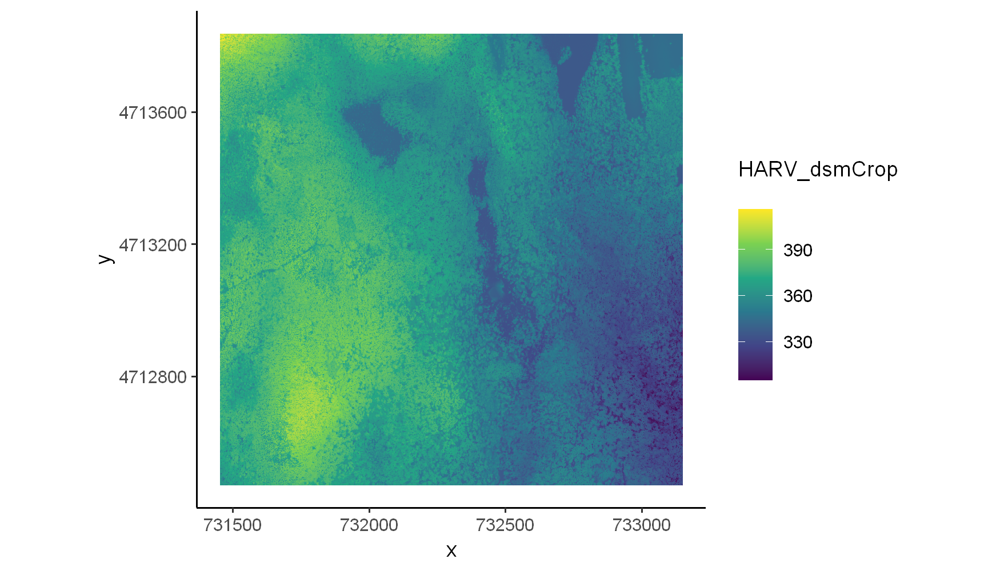

In [15]:
ggplot() +
    geom_raster(data = DSM_HARV_df , aes(x = x, y = y, fill = HARV_dsmCrop)) +
    scale_fill_viridis_c() +
    coord_quickmap()+
    theme_classic()

This map shows the elevation of our study site in Harvard Forest. From the legend, we can see that the maximum elevation is ~400, but we can’t tell whether this is 400 feet or 400 meters because the legend doesn’t show us the units. We can look at the metadata of our object to see what the units are. Much of the metadata that we’re interested in is part of the Coordinate Reference System (CRS). 

## View Raster Coordinate Reference System (CRS) in R

The Coordinate Reference System or CRS of a spatial object tells R where the raster is located in geographic space. It also tells R what mathematical method should be used to “flatten” or project the raster in geographic space.

<span class="important"></span>Data from the same location but saved in different coordinate references systems will not line up in any GIS or other program. It’s important when working with spatial data to identify the coordinate reference system applied to the data and retain it throughout data processing and analysis.

Now we will see how features of the CRS appear in our data file and what meanings they have. We can view the CRS string associated with our R object using the `crs()` function.

### Understanding CRS in Proj4 Format

The CRS for our data is given to us by R in `proj4` format. Let’s break down the pieces of `proj4` string. The string contains all of the individual CRS elements that R or another GIS might need. Each element is specified with a `+` sign, similar to how a `.csv` file is delimited or broken up by a `,`. After each `+` we see the CRS element being defined. For example projection (`proj=`) and datum (`datum=`).

Our projection string for `DSM_HARV` is specified as follows:
<br>
<div class="use_console"></div>

In [16]:
crs(DSM_HARV)

CRS arguments:
 +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 

* proj=utm: the projection is UTM, UTM has several zones.
* zone=18: the zone is 18
* datum=WGS84: the datum is WGS84 (the datum refers to the 0,0 reference for the coordinate system used in the projection)
* units=m: the units for the coordinates are in meters
* ellps=WGS84: the ellipsoid (how the earth’s roundness is calculated) for the data is WGS84

<span class="note"></span> The zone is unique to the UTM projection. Not all CRSs will have a zone.
<br>
<img src="UTM-zones.png">
*The UTM zones across the continental United States. Source: Chrismurf, wikimedia.org.
<br>

## Calculate Raster Min and Max Values

It is useful to know the minimum or maximum values of a raster dataset. In this case, given we are working with elevation data, these values represent the min/max elevation range at our site.

Raster statistics are often calculated and embedded in a GeoTIFF. Let's take a look at the minimum
<br>
<div class="use_console"></div>

In [17]:
minValue(DSM_HARV)

[1] 305.07

and maximum values in our raster data
<br>
<div class="use_console"></div>

In [18]:
maxValue(DSM_HARV)

[1] 416.07

We can also calculate and set them using the `setMinMax()` function
<br>
<div class="use_console"></div>

In [18]:
DSM_HARV <- setMinMax(DSM_HARV)

DSM_HARV

class      : RasterLayer 
dimensions : 1367, 1697, 2319799  (nrow, ncol, ncell)
resolution : 1, 1  (x, y)
extent     : 731453, 733150, 4712471, 4713838  (xmin, xmax, ymin, ymax)
crs        : +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 
source     : C:/Users/flyin/Documents/Biol3782/biol3782/Week 9/raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_dsmCrop.tif 
names      : HARV_dsmCrop 
values     : 305.07, 416.07  (min, max)


We can see that the elevation at our site ranges from 305.0700073m to 416.0699768m.

## Raster Bands

The **Digital Surface Model** object (DSM_HARV) that we’ve been working with is a single band raster. This means that there is only one dataset stored in the raster: surface elevation in meters for one time period.
<br>
<img src="single_multi_raster.png">
<br>
A raster dataset can contain one or more bands, meaning that one raster file contains data for more than one variable or time period for each cell. We can use the `raster()` function to import one single band from a single or multi-band raster. By default the `raster(`) function only imports the first band in a raster regardless of whether it has one or more bands. We can also view the number of bands in a raster using the `nlayers()` function.
<br>
<div class="use_console"></div>

In [20]:
nlayers(DSM_HARV)

[1] 1

## Dealing with Missing Data

Raster data often has a `NoDataValue` associated with it. This is a value assigned to pixels where data is missing or no data were collected.

By default the shape of a raster is always rectangular. So if we have a dataset that has a shape that isn’t rectangular, some pixels at the edge of the raster will have `NoDataValues`. This may happens when the data were collected by an airplane which only flew over some part of a defined region.

In the image below, the pixels that are black have NoDataValues. The camera did not collect data in these areas.
<br>
<img src="rmd-01-demonstrate-no-data-black-ggplot-1.png">
<br>
In the next image, the black edges have been assigned `NoDataValue`. R doesn’t render pixels that contain a specified `NoDataValue`. R assigns missing data with the `NoDataValue` as NA. The difference here shows up as ragged edges on the plot, rather than black spaces where there is no data.
<br>
<img src="rmd-01-demonstrate-no-data-ggplot-1.png">
<br>
If your raster already has NA values set correctly but you aren’t sure where they are, you can deliberately plot them in a particular colour. This can be useful when checking a dataset’s coverage. For instance, sometimes data can be missing where a sensor could not ‘see’ its target data, and you may wish to locate that missing data and fill it in.

The value that is conventionally used to take note of missing data (the NoDataValue value) varies by the raster data type. For floating-point rasters, the figure -3.4e+38 is a common default, and for integers, -9999 is common. Some disciplines have specific conventions that vary from these common values.

In some cases, other NA values may be more appropriate. An NA value should be a) outside the range of valid values, and b) a value that fits the data type in use. For instance, if your data ranges continuously from -20 to 100, 0 is not an acceptable NA value! Or, for categories that number 1-15, 0 might be fine for NA, but using -.000003 will force you to save the GeoTIFF on disk as a floating point raster, resulting in a bigger file.

If we are lucky, our GeoTIFF file has a tag that tells us what is the `NoDataValue`. If we are less lucky, we can find that information in the raster’s metadata. If a `NoDataValue` was stored in the GeoTIFF tag, when R opens up the raster, it will assign each instance of the value to NA. Values of NA will be ignored by R as demonstrated above.

## Rasters with bad values

Bad data values are values that fall outside of the applicable range of a dataset.

Examples of Bad Data Values:

* The normalized difference vegetation index (NDVI), which is a measure of greenness, has a valid range of -1 to 1. Any value outside of that range would be considered a “bad” or miscalculated value.
* Reflectance data in an image will often range from 0-1 or 0-10,000 depending upon how the data are scaled. Thus a value greater than 1 or greater than 10,000 is likely caused by an error in either data collection or processing.

Sometimes a raster’s metadata will tell us the range of expected values for a raster. Values outside of this range are suspect and we need to consider that when we analyze the data. Sometimes, we need to use some common sense and scientific insight as we examine the data - just as we would for field data to identify questionable values.

Plotting data with appropriate highlighting can help reveal patterns in bad values and may suggest a solution. Below, reclassification is used to highlight elevation values over 400m with a contrasting colour.
<br>
<img src="rmd-01-demo-bad-data-highlighting-1.png">
<br>

### Finding bad values and outliers with histograms

We can explore the distribution of values contained within our raster using a histogram. Histograms are often useful in identifying outliers and bad data values in our raster data.
<br>
<div class="use_console"></div>

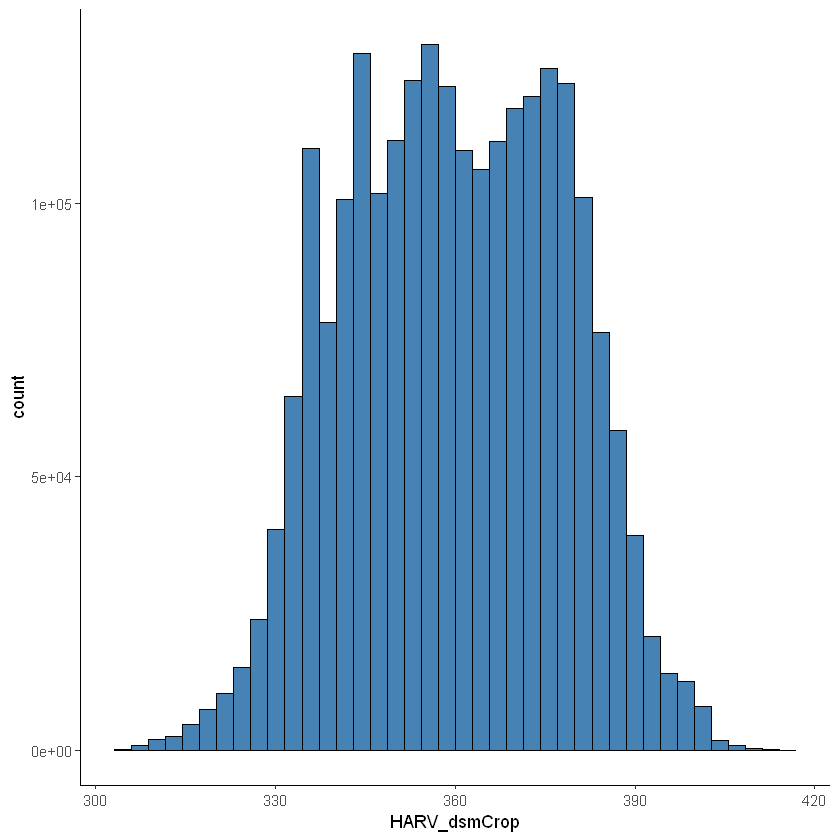

In [19]:
ggplot() +
    geom_histogram(data = DSM_HARV_df, aes(HARV_dsmCrop),bins = 40, color="black", fill="steelblue")+
    theme_classic()

The distribution of elevation values for our **Digital Surface Model** (DSM) looks reasonable. It is likely there are no bad data values in this particular raster.

<div class="Q"><br><br>

TRUE or FALSE: The GeoTIFF file format include metadata about the raster data. 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

TRUE or FALSE: R stores CRS information in the Proj4 format. 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

TRUE or FALSE: We can directly plot raster data in <b>ggplot</b> without modifying it. 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What should we check our raster data for before performing analysis?
 
<br><br><div class="qhelp"></div></div>

<br><br><br>
<div class="startTASK"></div>

Exploring Raster Metadata
<br>
Use <b>GDALinfo()</b> and the file <b>NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_DSMhill.tif</b> to answer the following questions in Brightspace.

<div class="endTASK"></div>
<br><br><br>

<div class="Q"><br><br>

Does <b>NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_DSMhill.tif</b> have the same CRS as <b>DSM_HARV</b>?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What format does the <b>NoDataValue</b> take?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What is resolution of the raster data?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

Given the resolution in the previous question, how large would a 5x5 pixel area be on the Earth’s surface?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

Is the file a multi- or single-band raster?
 
<br><br><div class="qhelp"></div></div>

# Plotting Raster data

## Plotting Data Using Breaks

We viewed our data using a continuous color ramp. For clarity and visibility of the plot, we may prefer to view the data “symbolized” or colored according to ranges of values. This is comparable to a “classified” map. To do this, we need to tell `ggplot` how many groups to break our data into, and where those breaks should be. To make these decisions, it is useful to first explore the distribution of the data using a bar plot. To begin with, we will use dplyr’s `mutate()` function combined with `cut()` to split the data into 3 bins.
<br>
<div class="use_editor"></div>

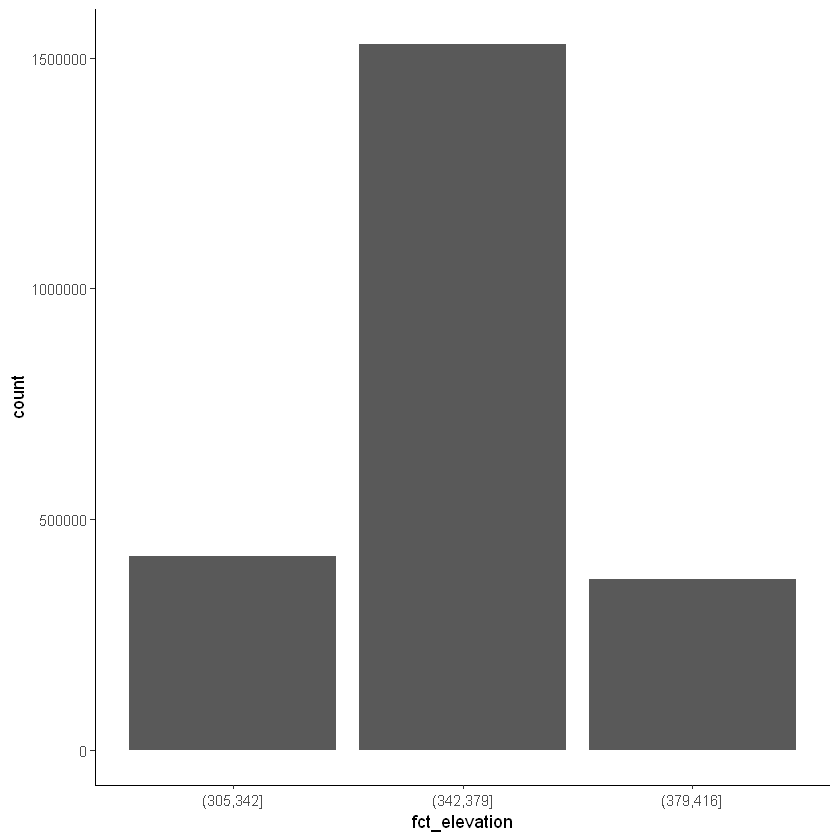

In [20]:
DSM_HARV_df <- DSM_HARV_df %>%
                mutate(fct_elevation = cut(HARV_dsmCrop, breaks = 3))

ggplot() +
    geom_bar(data = DSM_HARV_df, aes(fct_elevation))+
    theme_classic()

We can get the count and cutt off values in each group using dplyr’s `group_by()` and `count()` functions.
<br>
<div class="use_console"></div>

In [30]:
DSM_HARV_df %>%
        group_by(fct_elevation) %>%
        count()

fct_elevation,n
<fct>,<int>
"(305,342]",418891
"(342,379]",1530073
"(379,416]",370835


We can also customize the cutoff values for these groups. Lets round the cutoff values so that we have groups for the ranges of 301–350 m, 351–400 m, and 401–450 m. To implement this we will give `mutate()` a numeric vector of break points instead of the number of breaks we want.

Let's create a vector of cut off ranges called `custom_bins` then use the `cut()` and `mutate()` functions to createa new column called `fct_elevation_2`.
<br>
<div class="use_editor"></div>

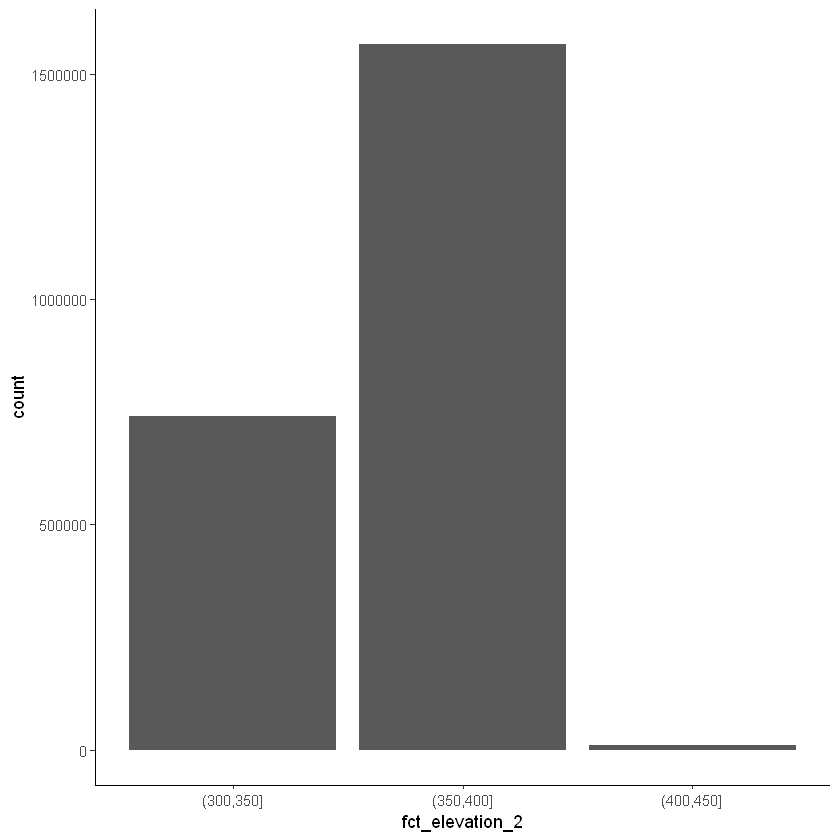

In [21]:
custom_bins <- c(300, 350, 400, 450)

DSM_HARV_df <- DSM_HARV_df %>%
  mutate(fct_elevation_2 = cut(HARV_dsmCrop, breaks = custom_bins))

ggplot() +
  geom_bar(data = DSM_HARV_df, aes(fct_elevation_2))+
  theme_classic()

<span class="note"></span> When we assign break values a set of 4 values will result in 3 bins of data.The bin intervals are shown using ( to mean exclusive and ] to mean inclusive. For example: (305, 342] means “from 306 through 342”.

We can use those groups to plot our raster data, with each group being a different color.
<br>
<div class="use_editor"></div>

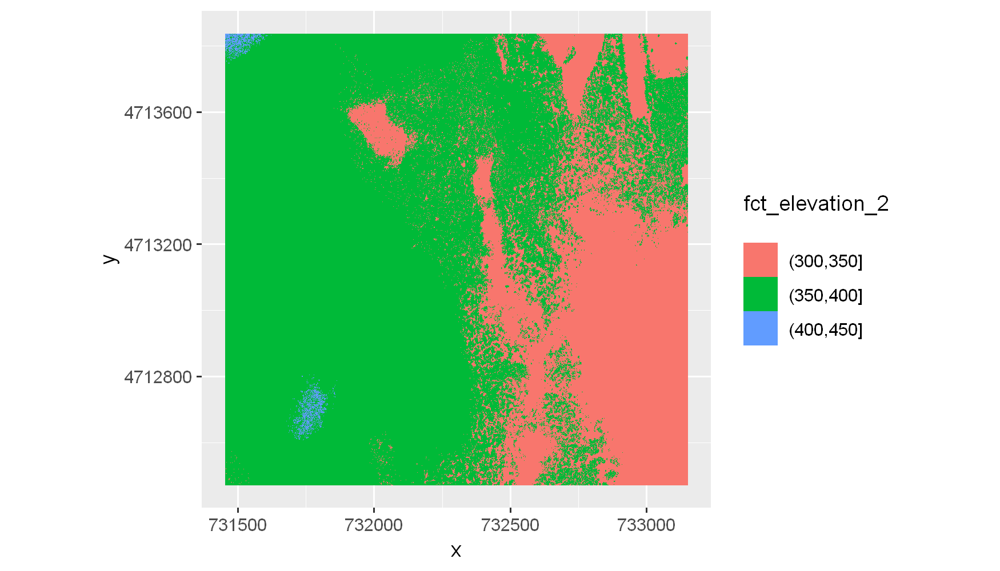

In [34]:
ggplot() +
  geom_raster(data = DSM_HARV_df , aes(x = x, y = y, fill = fct_elevation_2)) + 
  coord_quickmap()+
  theme_classic()

R has a built in set of colors for plotting terrain, which are built in to the `terrain.colors()` function. Since we have three bins, we can create a 3-color palette.
<br>
<div class="use_editor"></div>

In [35]:
terrain.colors(3)

[1] "#00A600" "#ECB176" "#F2F2F2"

The `terrain.colors()` function returns hex colors - each of these character strings represents a color. To use these in our map, we pass them across using the `scale_fill_manual()` function.
<br>
<div class="use_editor"></div>

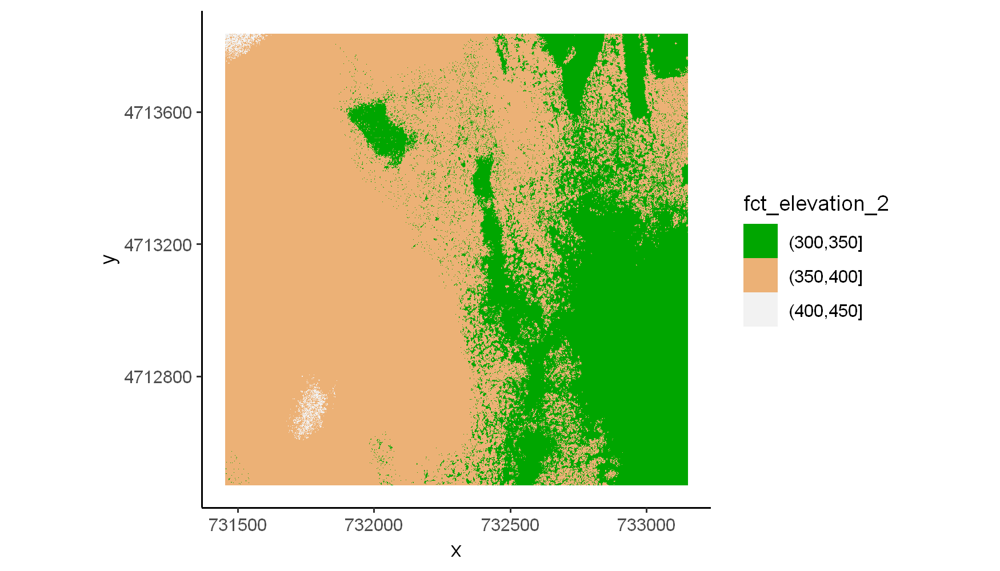

In [36]:
ggplot() +
 geom_raster(data = DSM_HARV_df , aes(x = x, y = y,
                                      fill = fct_elevation_2)) + 
    scale_fill_manual(values = terrain.colors(3)) + 
    coord_quickmap()+
    theme_classic()

## Layering Rasters

We can layer a raster on top of a hillshade raster for the same area, and use a transparency factor to create a 3-dimensional shaded effect. A hillshade is a raster that maps the shadows and texture that you would see from above when viewing terrain. We will add a custom color, making the plot grey.

First let's read in our DSM hillshade data and view the structure.
<br>
<div class="use_editor"></div>

In [22]:
DSM_hill_HARV <-
  raster("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_DSMhill.tif")

DSM_hill_HARV

class      : RasterLayer 
dimensions : 1367, 1697, 2319799  (nrow, ncol, ncell)
resolution : 1, 1  (x, y)
extent     : 731453, 733150, 4712471, 4713838  (xmin, xmax, ymin, ymax)
crs        : +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 
source     : C:/Users/flyin/Documents/Biol3782/biol3782/Week 9/raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DSM/HARV_DSMhill.tif 
names      : HARV_DSMhill 
values     : -0.7136298, 0.9999997  (min, max)


Let's convert it to a dataframe so we can plot it with `ggplot`.
<br>
<div class="use_editor"></div>

In [23]:
DSM_hill_HARV_df <- as.data.frame(DSM_hill_HARV, xy = TRUE) 

str(DSM_hill_HARV_df)

'data.frame':	2319799 obs. of  3 variables:
 $ x           : num  731454 731455 731456 731457 731458 ...
 $ y           : num  4713838 4713838 4713838 4713838 4713838 ...
 $ HARV_DSMhill: num  NA NA NA NA NA NA NA NA NA NA ...


Now we can plot the data.
<br>
<div class="use_editor"></div>

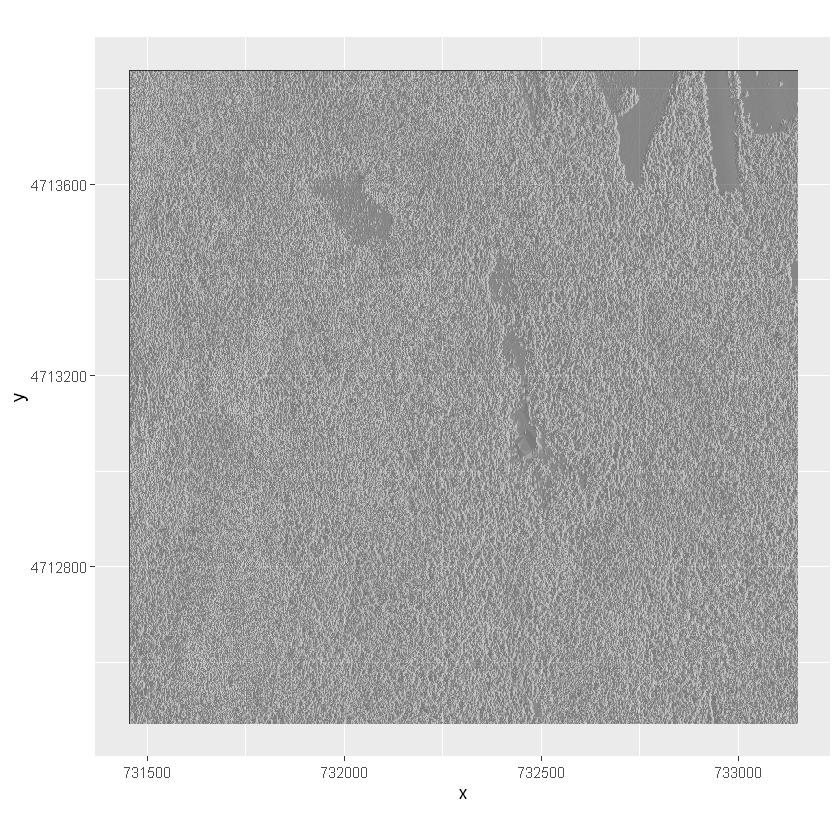

In [24]:
ggplot() +
  geom_raster(data = DSM_hill_HARV_df,
              aes(x = x, y = y, alpha = HARV_DSMhill)) + 
  scale_alpha(range =  c(0.15, 0.65), guide = "none") + 
  coord_quickmap()+
  theme_classic()

We've created a plot in grey scale with the `alpha` arguement controlling transparency (0 being transparent, 1 being opaque). 

We can layer another raster on top of our hillshade by adding another call to the `geom_raster()` function. Let’s overlay `DSM_HARV` on top of the `hill_HARV`.
<br>
<div class="use_editor"></div>

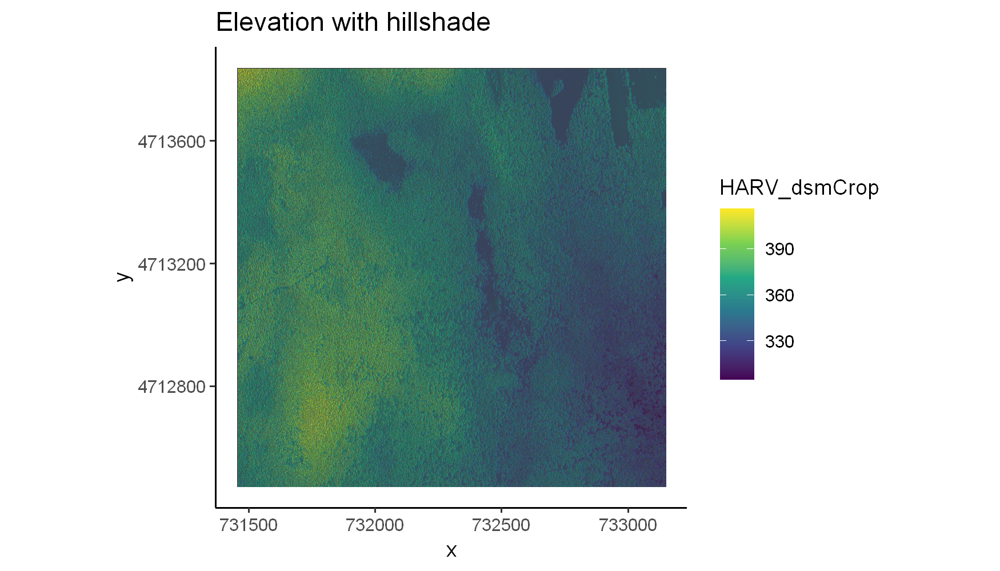

In [42]:
ggplot() +
  geom_raster(data = DSM_HARV_df , 
              aes(x = x, y = y, 
                  fill = HARV_dsmCrop)) + 
  geom_raster(data = DSM_hill_HARV_df, 
              aes(x = x, y = y, 
                  alpha = HARV_DSMhill)) +  
  scale_fill_viridis_c() +  
  scale_alpha(range = c(0.15, 0.65), guide = "none") +  
  ggtitle("Elevation with hillshade") +
  coord_quickmap()+
  theme_classic()

<div class="Q"><br><br>

Can continuous data ranges be grouped into categories using <b>mutate()</b> and <b>cut()</b>?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What does <b>terrain.colors</b> do?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What <b>ggplot</b> arguement/parameter can you use to layer rasters on top of each other?
 
<br><br><div class="qhelp"></div></div>

# Raster projection in R

Sometimes we encounter raster datasets that do not “line up” when plotted or analyzed. Rasters that don’t line up are most often in different Coordinate Reference Systems (CRS).

We will be working with the <span class="file">Harvard Forest Digital Terrain Model</span> data. This differs from the surface model data we’ve been working with so far in that the **digital surface model** (DSM) includes the tops of trees, while the **digital terrain model** (DTM) shows the ground level.

Here, we will create a map of the `Harvard Forest Digital Terrain Model` (DTM_HARV) draped or layered on top of the `hillshade` (DTM_hill_HARV). The hillshade layer maps the terrain using light and shadow to create a 3D-looking image, based on a hypothetical illumination of the ground level.

First, let's import the DTM and DTM hillshade data and convert them to dataframes.
<br>
<div class="use_editor"></div>

In [25]:
DTM_HARV <- raster("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DTM/HARV_dtmCrop.tif")  

DTM_HARV_df <- as.data.frame(DTM_HARV, xy = TRUE)

DTM_hill_HARV <- raster("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/DTM/HARV_DTMhill_WGS84.tif") 

DTM_hill_HARV_df <- as.data.frame(DTM_hill_HARV, xy = TRUE)

Now we can create a map of the DTM layered over the hillshade.
<br>
<div class="use_console"></div>

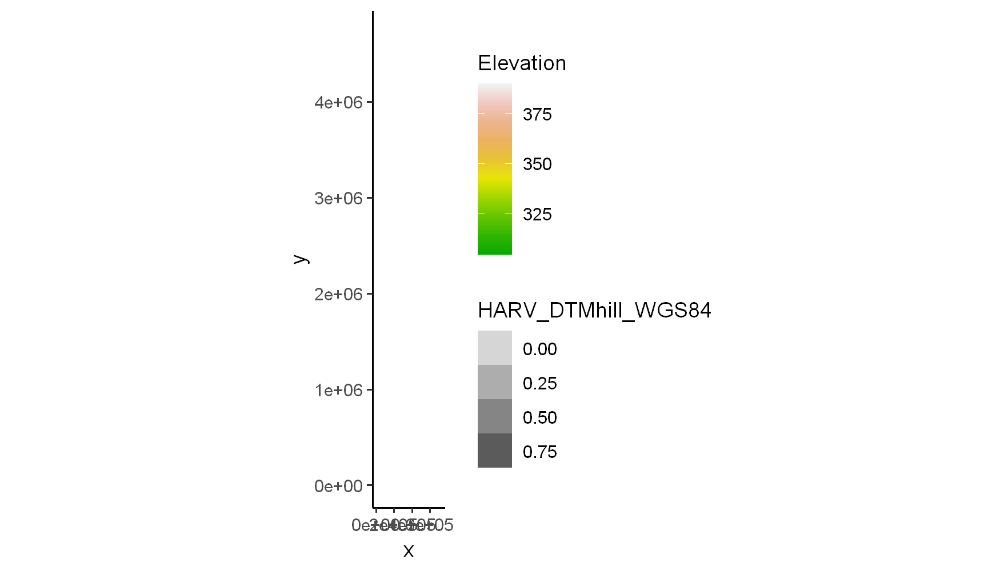

In [50]:
ggplot() +
     geom_raster(data = DTM_HARV_df , 
                 aes(x = x, y = y, 
                  fill = HARV_dtmCrop)) + 
     geom_raster(data = DTM_hill_HARV_df, 
                 aes(x = x, y = y, 
                   alpha = HARV_DTMhill_WGS84)) +
     scale_fill_gradientn(name = "Elevation", colors = terrain.colors(10)) + 
     coord_quickmap()+
     theme_classic()

Notice that nothing got plotted. Let’s try to plot the DTM on its own to make sure there are data there.
<br>
<div class="use_console"></div>

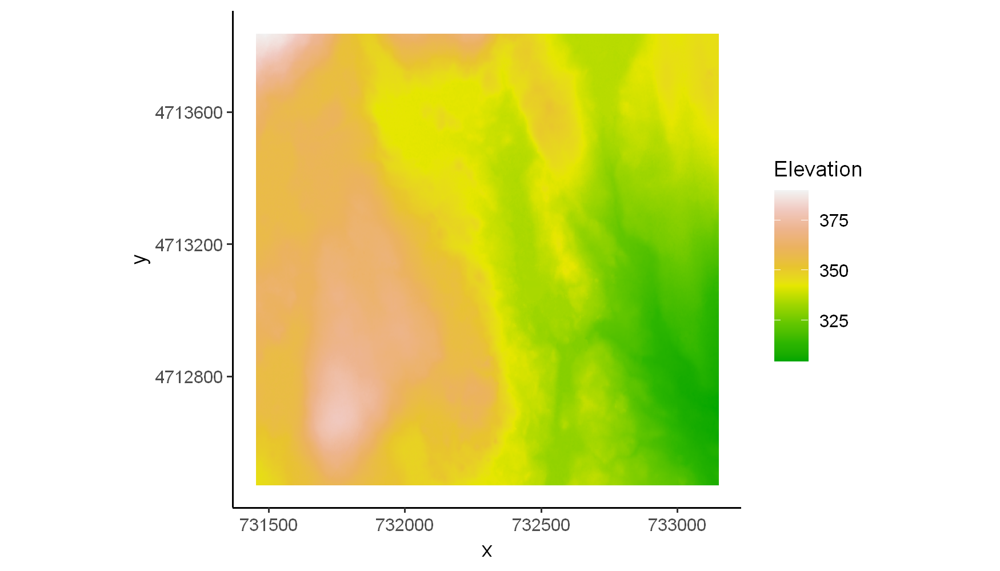

In [51]:
ggplot() +
  geom_raster(data = DTM_HARV_df,
    aes(x = x, y = y,
    fill = HARV_dtmCrop)) +
  scale_fill_gradientn(name = "Elevation", colors = terrain.colors(10)) + 
  coord_quickmap()+
  theme_classic()

Now, let’s try to plot the DTM Hillside data on its own to make sure there are data there.
<br>
<div class="use_console"></div>

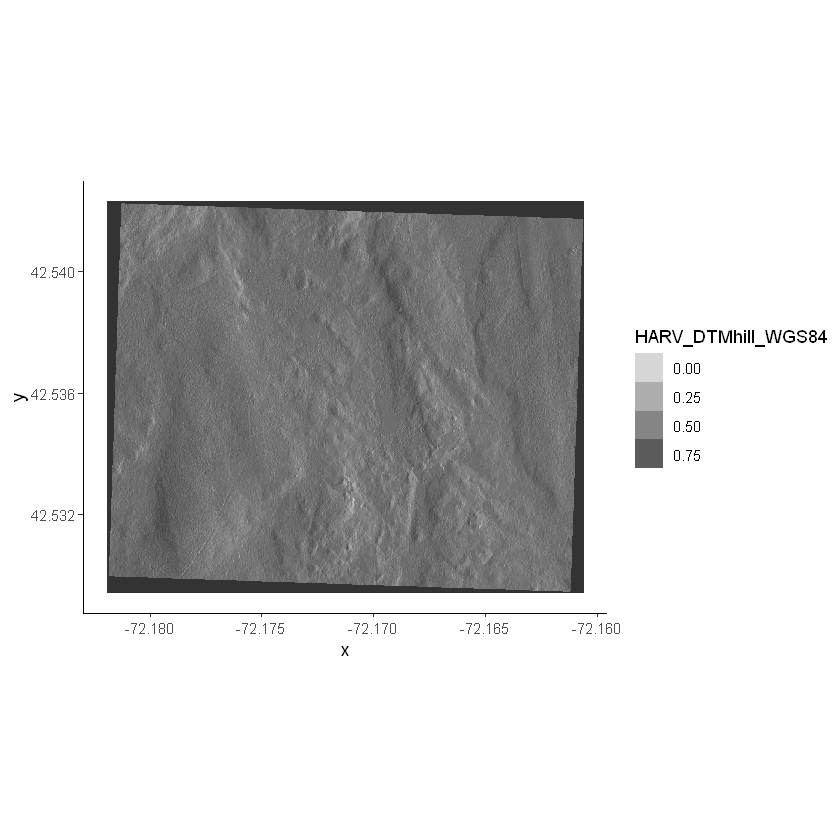

In [26]:
ggplot() +
 geom_raster(data = DTM_hill_HARV_df,
    aes(x = x, y = y,
    alpha = HARV_DTMhill_WGS84)) + 
  coord_quickmap()+
  theme_classic()

Notice that the axis values are different. When this is the case, `ggplot` won’t render the image or throw an error message to tell you something has gone wrong. We'll have to look at Coordinate Reference Systems (CRSs) of the DTM and the hillshade data to see how they differ. 

If they have different projections, we need to reproject (change the projection of) one to match the other. 

<br><br><br>
<div class="startTASK"></div>

How do <b>DTM_HARV</b> and <b>DTM_hill_HARV</b> differ?
<br>
Use the CRS of each raster object to answer the following questions in Brightspace.

<div class="endTASK"></div>
<br><br><br>

<div class="Q"><br><br>

What projection does <b>DTM_HARV</b> use?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What units of measure does <b>DTM_HARV</b> use?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What projection does <b>DTM_hill_HARV</b> use?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What units of measure does <b>DTM_HARV</b> use?
 
<br><br><div class="qhelp"></div></div>

## Reproject Rasters

We can use the `projectRaster()` function to re-project a raster into a new CRS. Keep in mind that re-projection only works when you first have a defined CRS for the raster object that you want to re-project. It cannot be used if no CRS is defined.
<br>
<span class="important"></span>When we re-project a raster, we move it from one “grid” to another. Thus, we are modifying the data! Keep this in mind as we work with raster data.

To use the projectRaster() function, we need to define two things:

* the object we want to reproject and
* the CRS that we want to reproject it to.

We want the CRS of our `hillshade` to match the `DTM_HARV` raster. We can thus assign the CRS of our `DTM_HARV` to our `hillshade` within the `projectRaster()` function as follows: 

crs = crs(DTM_HARV) 

<span class="note"></span> We are using the `projectRaster()` function on the raster object, not the `data.frame()` we use for plotting with ggplot.

First we will reproject our `DTM_hill_HARV` raster data to match the `DTM_HARV` raster CRS.
<br>
<div class="use_editor"></div>

In [27]:
DTM_hill_UTMZ18N_HARV <- projectRaster(DTM_hill_HARV,
                                       crs = crs(DTM_HARV))

Now let's check to make sure they're both the same.
<br>
<div class="use_console"></div>

In [28]:
crs(DTM_hill_UTMZ18N_HARV)

crs(DTM_hill_HARV)

CRS arguments:
 +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 

CRS arguments: +proj=longlat +datum=WGS84 +no_defs 

Now they both use WGS84. Let's also check to see if their extents are the same. 
<br>
<div class="use_console"></div>

In [29]:
extent(DTM_hill_UTMZ18N_HARV)

extent(DTM_hill_HARV)

class      : Extent 
xmin       : 731397.3 
xmax       : 733205.3 
ymin       : 4712403 
ymax       : 4713907 

class      : Extent 
xmin       : -72.18192 
xmax       : -72.16061 
ymin       : 42.52941 
ymax       : 42.54234 

Notice in the output above that the crs() of `DTM_hill_UTMZ18N_HARV` is now UTM. However, the extent values of `DTM_hillUTMZ18N_HARV` are different from `DTM_hill_HARV`. This is because the extent for `DTM_hill_UTMZ18N_HARV` is in UTMs so the extent is in meters. While the extent for `DTM_hill_HARV` is in lat/long so the extent is expressed in decimal degrees.

<span class="important"></span>Proceed with caution when you are reprojecting raster data. Often it’s best to reproject your vector data as reprojecting a raster means that the entire dataset are interpolated and cast into a new grid system. This adds error and uncertainty to your analysis. There are times when you need to reproject your data. However, consider carefully whether you need to do this, before implementimg it in an analysis.

<div class="Q"><br><br>

What does reprojecting rasters mean?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What should you be cautious about when reprojecting a raster?  
 
<br><br><div class="qhelp"></div></div>

# Raster Resolution

Sometimes you'll have the same data with different resolution. We can tell R to force our newly reprojected raster to be 1m x 1m resolution by adding a line of code `res=1` within the `projectRaster()` function. 
<br>
<div class="use_editor"></div>

In [57]:
 DTM_hill_UTMZ18N_HARV <- projectRaster(DTM_hill_HARV,
                                         crs = crs(DTM_HARV),
                                         res = res(DTM_HARV)) 

Let's check to see if both rasters have the same resolution.
<br>
<div class="use_console"></div>

In [58]:
res(DTM_hill_UTMZ18N_HARV)

res(DTM_HARV)

[1] 1 1

[1] 1 1

Now that they're the same,  we can create a dataframe from our newly re-projected raster then plot the data.
<br>
<div class="use_editor"></div>

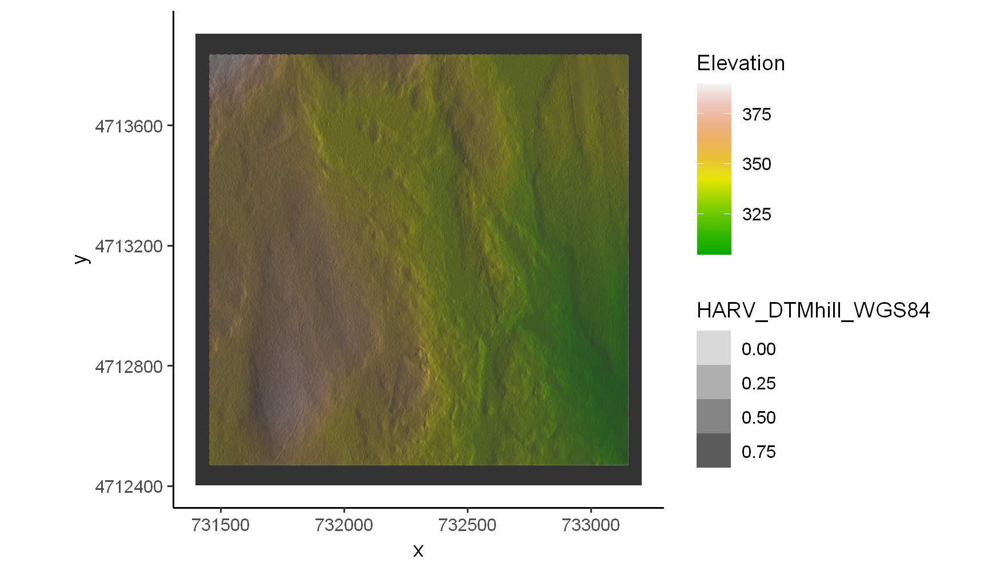

In [59]:
DTM_hill_HARV_2_df <- as.data.frame(DTM_hill_UTMZ18N_HARV, xy = TRUE)

ggplot() +
     geom_raster(data = DTM_HARV_df , 
                 aes(x = x, y = y, 
                  fill = HARV_dtmCrop)) + 
     geom_raster(data = DTM_hill_HARV_2_df, 
                 aes(x = x, y = y, 
                   alpha = HARV_DTMhill_WGS84)) +
     scale_fill_gradientn(name = "Elevation", colors = terrain.colors(10)) + 
     coord_quickmap()+
     theme_classic()

<div class="Q"><br><br>

What is raster resolution?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

Can you plot two raster datasets together if they have different CRS?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What function can you use to convert between CRS?
 
<br><br><div class="qhelp"></div></div>

# Raster Calculations in R

We often want to perform calculations on two or more rasters to create a new output raster. For example, if we are interested in mapping the heights of trees across an entire field site, we might want to calculate the difference between the Digital Surface Model (DSM, tops of trees) and the Digital Terrain Model (DTM, ground level). The resulting dataset is referred to as a Canopy Height Model (CHM) and represents the actual height of trees, buildings, etc. with the influence of ground elevation removed.
<br>
<img src="lidarTree-height.png">
<br>

## Two Ways to Perform Raster Calculations

We can calculate the difference between two rasters in two different ways:

* by directly subtracting the two rasters in R using raster math
or for more efficient processing - particularly if our rasters are large and/or the calculations we are performing are complex:

* using the `overlay()` function.

### Raster Math

We can perform raster calculations by subtracting (or adding, multiplying, etc) two rasters. In the geospatial world, we call this “raster math”.Let’s subtract the DTM from the DSM to create then plot a Canopy Height Model. 
<br>
<div class="use_editor"></div>

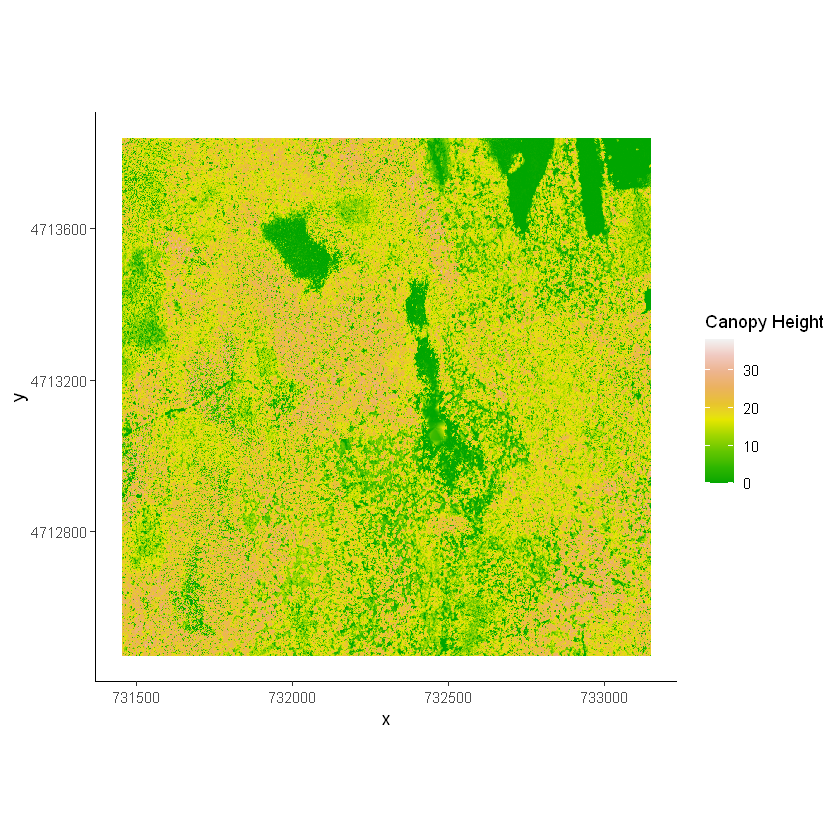

In [30]:
CHM_HARV <- DSM_HARV - DTM_HARV

CHM_HARV_df <- as.data.frame(CHM_HARV, xy = TRUE)

ggplot() +
   geom_raster(data = CHM_HARV_df , 
               aes(x = x, y = y, fill = layer)) + 
   scale_fill_gradientn(name = "Canopy Height", colors = terrain.colors(10)) + 
   coord_quickmap()+
   theme_classic()

Let’s inspect the distribution of values in our newly created Canopy Height Model (CHM).
<br>
<div class="use_editor"></div>

Warning message:
"Removed 1 rows containing non-finite values (stat_bin)."


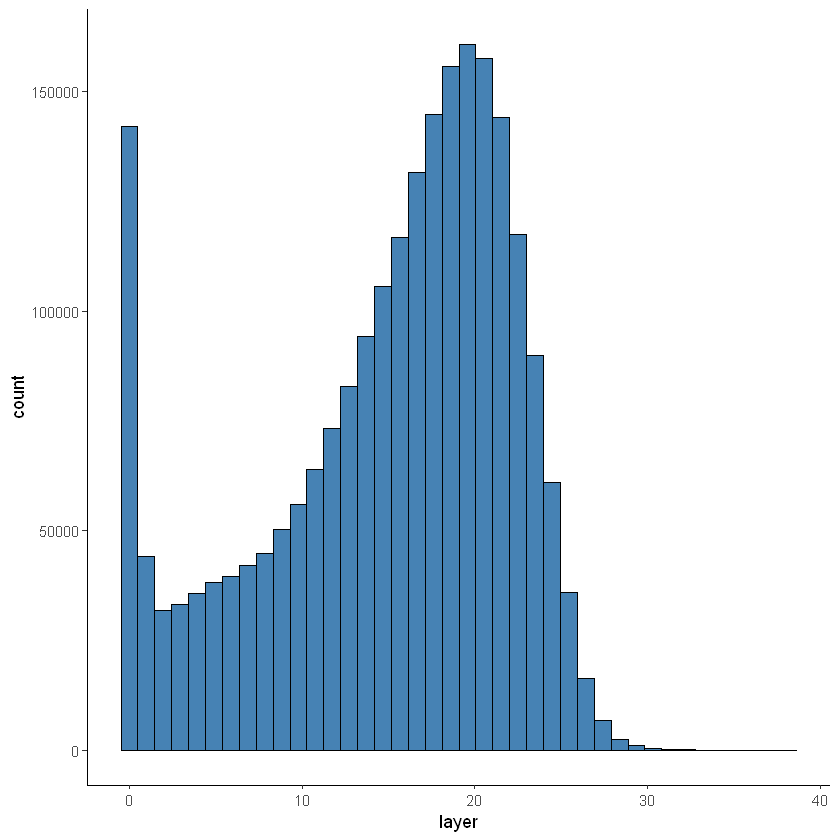

In [31]:
ggplot(CHM_HARV_df) +
    geom_histogram(aes(layer),bins = 40, color="black", fill="steelblue")+
   theme_classic()

Notice that the range of values for the output CHM is between 0 and 30 meters. Does this make sense?

<div class="Q"><br><br>

What is <b>raster math</b>? 
 
<br><br><div class="qhelp"></div></div>

<br><br><br>
<div class="startTASK"></div>

Check to see if model makes sense
<br>
Using the <b>CHM_HARV</b> raster object we created, answer the following questions in Brightspace.

<div class="endTASK"></div>
<br><br><br>

<div class="Q"><br><br>

What is the min and maximum value for the <b>Harvard Forest Canopy Height Model (CHM_HARV)</b>? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What are ways you can check this range of data for <b>CHM_HARV</b>? 
 
<br><br><div class="qhelp"></div></div>

### Efficient Raster Calculations: Overlay Function

Raster math, like we just did, is an appropriate approach to raster calculations if:

1. The rasters we are using are small in size.
1. The calculations we are performing are simple.

However, raster math is a less efficient approach as computation becomes more complex or as file sizes become large. The `overlay()` function is more efficient when:

1. The rasters we are using are larger in size.
1. The rasters are stored as individual files.
1. The computations performed are complex.

The `overlay()` function takes two or more rasters and applies a function to them using efficient processing methods.

Let’s perform the same subtraction calculation that we calculated above using raster math, using the `overlay()` function.
<br>
<div class="use_editor"></div>

In [67]:
CHM_ov_HARV <- overlay(DSM_HARV,
                       DTM_HARV,
                       fun = function(r1, r2) { return( r1 - r2) })

CHM_ov_HARV_df <- as.data.frame(CHM_ov_HARV, xy = TRUE)

Now that our data is in the correct format, we can plot it.
<br>
<div class="use_editor"></div>

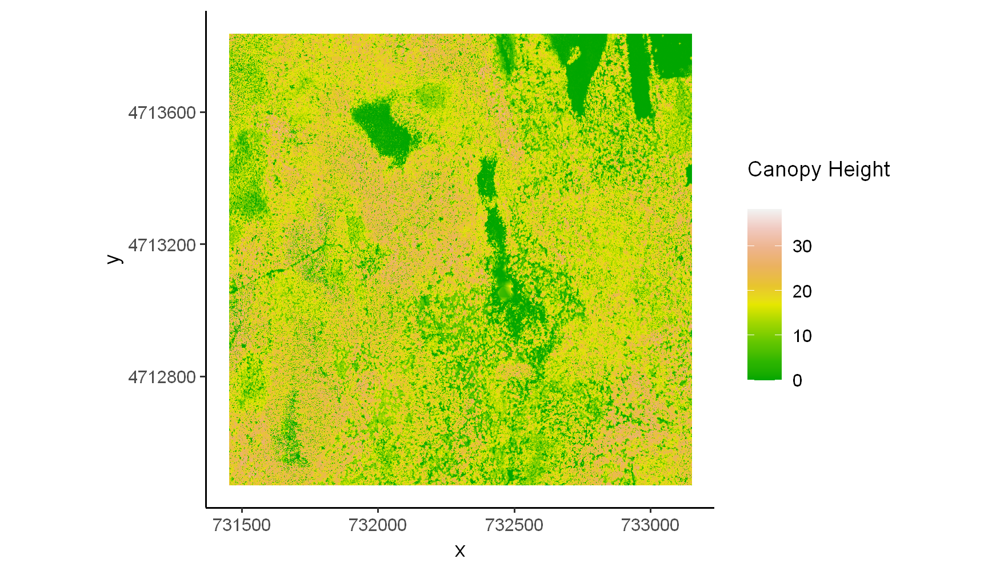

In [68]:
ggplot() +
   geom_raster(data = CHM_ov_HARV_df, 
               aes(x = x, y = y, fill = layer)) + 
   scale_fill_gradientn(name = "Canopy Height", colors = terrain.colors(10)) + 
   coord_quickmap()+
   theme_classic()

How do the plots of the CHM created with manual raster math and the `overlay()` function compare?

<div class="Q"><br><br>

What does the <b>overlay()</b> function do? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

How is <b>raster math</b> different from the <b>overlay()</b> function? 
 
<br><br><div class="qhelp"></div></div>

# Multiple Raster Bands

So far we've worked with single band rasters. When there are multiple bands, every cell location has more than one value associated with it. With multiple bands, each band usually represents a segment of the electromagnetic spectrum collected by a sensor. Bands can represent any portion of the electromagnetic spectrum, including ranges not visible to the eye, such as the infrared or ultraviolet sections. The term band originated from the reference to the color band on the electromagnetic spectrum. A satellite image, for example, commonly has multiple bands representing different wavelengths from the ultraviolet through the visible and infrared portions of the electromagnetic spectrum. Landsat imagery, for example, is data collected from seven different bands of the electromagnetic spectrum. Bands 1–7, including 6, represent data from the visible, near infrared, and midinfrared regions. Band 6 collects data from the thermal infrared region. Another example of a multiband image is a true color orthophoto in which there are three bands, each representing either red, green, or blue light.
<br>
<img src="multi.png">
<br>
The multi-band data that we are working with is imagery collected using the NEON Airborne Observation Platform high resolution camera over the NEON Harvard Forest field site. Each RGB image is a 3-band raster. The same steps would apply to working with a multi-spectral image with 4 or more bands - like Landsat imagery.

If we read a RasterStack object into R using the `raster()` function, it only reads in the first band.
<br>
<div class="use_editor"></div>

In [3]:
RGB_band1_HARV <- raster("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/RGB_Imagery/HARV_RGB_Ortho.tif")

Let's convert this data into a dataframe and plot it with `ggplot`. 
<br>
<div class="use_editor"></div>

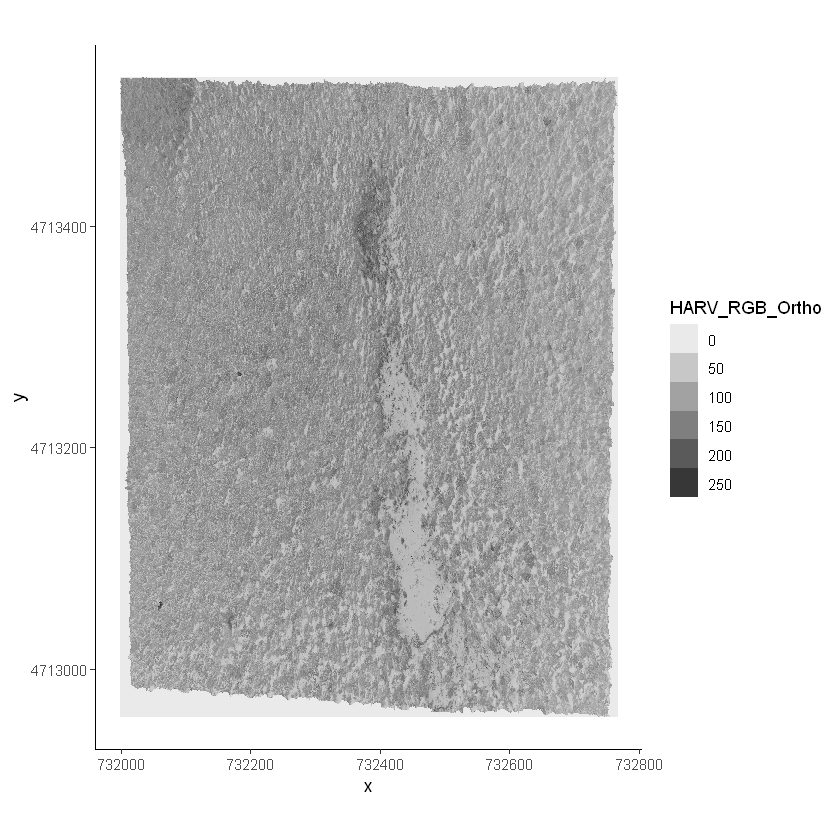

In [4]:
RGB_band1_HARV_df  <- as.data.frame(RGB_band1_HARV, xy = TRUE)

ggplot() +
  geom_raster(data = RGB_band1_HARV_df,
              aes(x = x, y = y, alpha = HARV_RGB_Ortho)) + 
  coord_quickmap()+
  theme_classic()

<div class="Q"><br><br>

What are the dimensions of <b>RGB_band1_HARV</b>? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What is the resolution of <b>RGB_band1_HARV</b>? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What is the units of measure of <b>RGB_band1_HARV</b>? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What are the min and max values of <b>RGB_band1_HARV</b>? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

How many bands are there in <b>RGB_band1_HARV</b>? 
 
<br><br><div class="qhelp"></div></div>

<span class="note"></span> This raster contains values between 0 and 255. These values represent degrees of brightness associated with the image band. In the case of a RGB image (red, green and blue), band 1 is the red band. When we plot the red band, larger numbers (towards 255) represent pixels with more red in them (a strong red reflection). Smaller numbers (towards 0) represent pixels with less red in them (less red was reflected). To plot an RGB image, we mix red + green + blue values into one single color to create a full color image - similar to the color image a digital camera creates.

## Import A Specific Band

We can use the `raster()` function to import specific bands in our raster object by specifying which band we want with band = N (N represents the band number we want to work with). To import the green band, we would use band = 2.
<br>
<div class="use_editor"></div>

In [6]:
RGB_band2_HARV <-  raster("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/RGB_Imagery/HARV_RGB_Ortho.tif", band = 2)

Let's convert this data into a dataframe and plot it with `ggplot`. 
<br>
<div class="use_editor"></div>

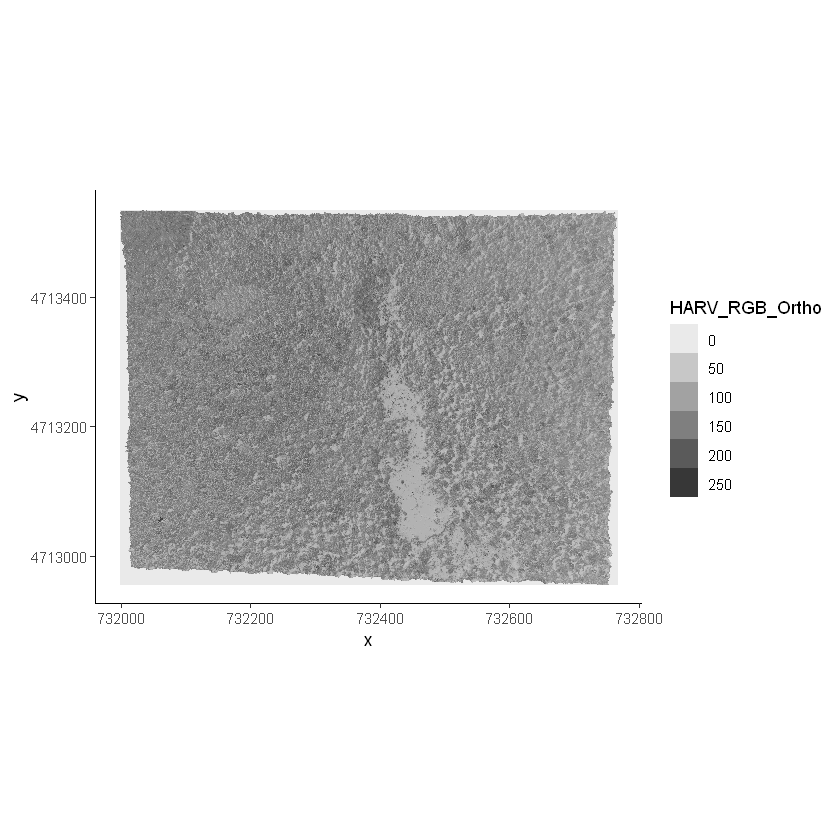

In [7]:
RGB_band2_HARV_df <- as.data.frame(RGB_band2_HARV, xy = TRUE)


ggplot() +
  geom_raster(data = RGB_band2_HARV_df,
              aes(x = x, y = y, alpha = HARV_RGB_Ortho)) + 
  coord_equal()+
  theme_classic()

<div class="Q"><br><br>

Compare the plots of band 1 (red) and band 2 (green). Is the forested area darker or lighter in band 2 (the green band) compared to band 1 (the red band)?
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

Why would you expect that previous answer? 
<br>
Hint: Think of how color and light are reflected and what each color band layer is telling you (i.e more reds mean more red color is reflected). 
 
<br><br><div class="qhelp"></div></div>

## Raster Stacks in R

Now, we will work with all three image bands (red, green and blue) as an R RasterStack object. We will then plot a 3-band composite, or full color, image.

To bring in all bands of a multi-band raster, we use the `stack()` function.
<br>
<div class="use_editor"></div>

In [8]:
RGB_stack_HARV <- stack("raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/RGB_Imagery/HARV_RGB_Ortho.tif")

Let’s preview the attributes of our stack object.
<br>
<div class="use_console"></div>

In [ ]:
RGB_stack_HARV

<div class="Q"><br><br>

How many bands/layers are there in <b>RGB_stack_HARV</b>? 
 
<br><br><div class="qhelp"></div></div>

We can also view the attributes of each band in the stack in a single output.
<br>
<div class="use_console"></div>

In [11]:
RGB_stack_HARV@layers

[[1]]
class      : RasterLayer 
band       : 1  (of  3  bands)
dimensions : 2317, 3073, 7120141  (nrow, ncol, ncell)
resolution : 0.25, 0.25  (x, y)
extent     : 731998.5, 732766.8, 4712956, 4713536  (xmin, xmax, ymin, ymax)
crs        : +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 
source     : C:/Users/flyin/Documents/Biol3782/biol3782/Week 9/raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/RGB_Imagery/HARV_RGB_Ortho.tif 
names      : HARV_RGB_Ortho.1 
values     : 0, 255  (min, max)


[[2]]
class      : RasterLayer 
band       : 2  (of  3  bands)
dimensions : 2317, 3073, 7120141  (nrow, ncol, ncell)
resolution : 0.25, 0.25  (x, y)
extent     : 731998.5, 732766.8, 4712956, 4713536  (xmin, xmax, ymin, ymax)
crs        : +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 
source     : C:/Users/flyin/Documents/Biol3782/biol3782/Week 9/raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/RGB_Imagery/HARV_RGB_Ortho.tif 
names      : HARV_RGB_Ortho.2 
values     : 0, 255  (min, max)


[[3]]
clas

Or we can index then examine a specific band.
<br>
<div class="use_console"></div>

In [12]:
RGB_stack_HARV[[2]]

class      : RasterLayer 
band       : 2  (of  3  bands)
dimensions : 2317, 3073, 7120141  (nrow, ncol, ncell)
resolution : 0.25, 0.25  (x, y)
extent     : 731998.5, 732766.8, 4712956, 4713536  (xmin, xmax, ymin, ymax)
crs        : +proj=utm +zone=18 +datum=WGS84 +units=m +no_defs 
source     : C:/Users/flyin/Documents/Biol3782/biol3782/Week 9/raw_data/NEON-DS-Airborne-Remote-Sensing/HARV/RGB_Imagery/HARV_RGB_Ortho.tif 
names      : HARV_RGB_Ortho.2 
values     : 0, 255  (min, max)


We can also plot the data in any layer of our RasterStack object by first converting it into a dataframe.
<br>
<div class="use_editor"></div>

In [9]:
RGB_stack_HARV_df  <- as.data.frame(RGB_stack_HARV, xy = TRUE)

Let's take a look at `RGB_stack_HARV_df`.
<br>
<div class="use_console"></div>

In [10]:
str(RGB_stack_HARV_df)

'data.frame':	7120141 obs. of  5 variables:
 $ x               : num  731999 731999 731999 731999 732000 ...
 $ y               : num  4713535 4713535 4713535 4713535 4713535 ...
 $ HARV_RGB_Ortho.1: num  0 2 6 0 16 0 0 6 1 5 ...
 $ HARV_RGB_Ortho.2: num  1 0 9 0 5 0 4 2 1 0 ...
 $ HARV_RGB_Ortho.3: num  0 10 1 0 17 0 4 0 0 7 ...


<div class="Q"><br><br>

What do you notice about the columns in <b>RGB_stack_HARV_df</b>? 
 
<br><br><div class="qhelp"></div></div>

Now let's plot the raster data of the first band using a histogram. We will specify the band name, `HARV_RGB_Ortho.1`, in the `aes` agruement of `geom_histogram`. 
<br>
<div class="use_editor"></div>

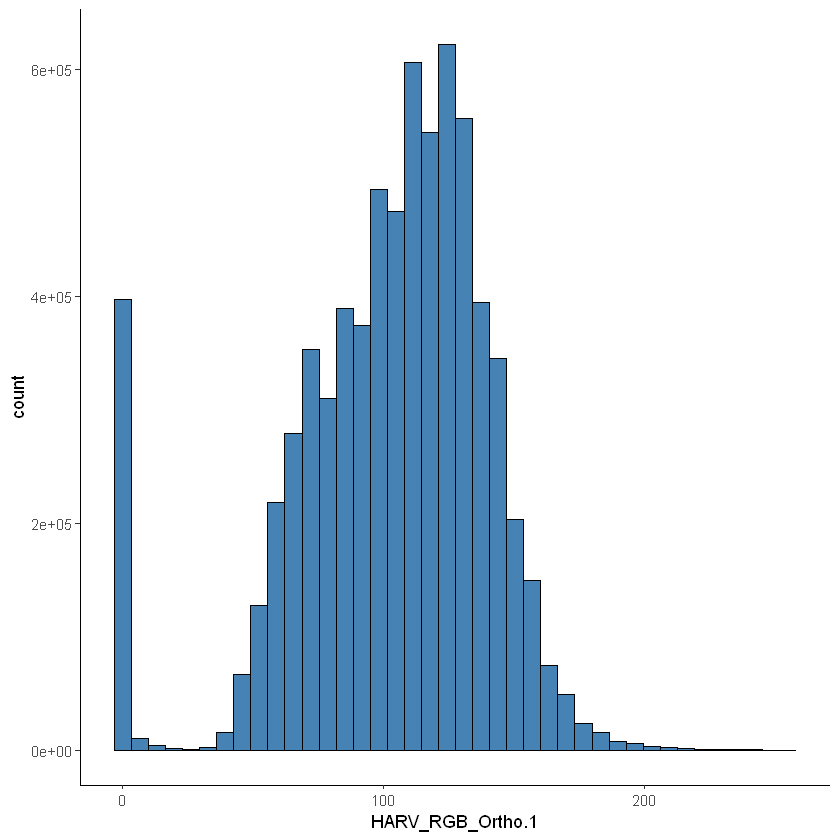

In [32]:
ggplot() +
  geom_histogram(data = RGB_stack_HARV_df, aes(HARV_RGB_Ortho.1),bins = 40, color = "black", fill = "steelblue")+
  theme_classic()

We can create raster plots of specific bands by specifying the band name in the `aes` arguement. Let's take a look at how this works by plotting the second band `HARV_RGB_Ortho.2`.
<br>
<div class="use_editor"></div>

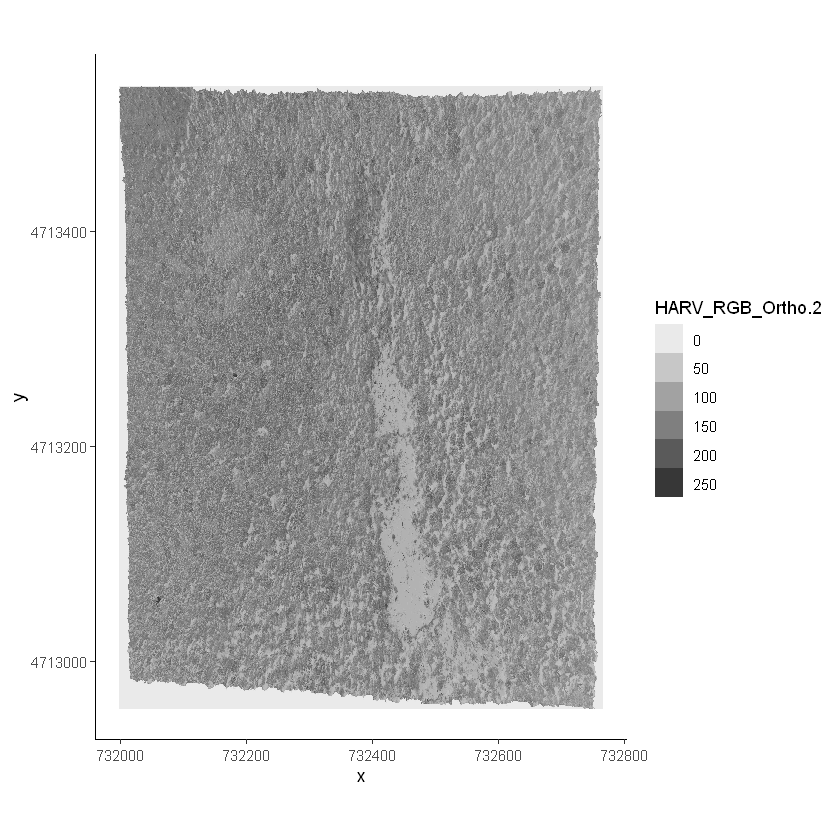

In [14]:
ggplot() +
  geom_raster(data = RGB_stack_HARV_df,
              aes(x = x, y = y, alpha = HARV_RGB_Ortho.2)) + 
  coord_quickmap()+
  theme_classic()

## Creating Multiband Images

To render a final three band, colored image in R, we use the `plotRGB()` function.

This function allows us to:

* Identify what bands we want to render in the red, green and blue regions. The plotRGB() function defaults to a 1=red, 2=green, and 3=blue band order. However, you can define what bands you’d like to plot manually. Manual definition of bands is useful if you have, for example a near-infrared band and want to create a color infrared image.
* Adjust the stretch of the image to increase or decrease contrast.

Let’s plot our 3-band image. 

<span class="important"></span> We can use the `plotRGB()` function directly with our RasterStack object (we don’t need a dataframe as this function isn’t part of the ggplot2 package).
<br>
<div class="use_editor"></div>

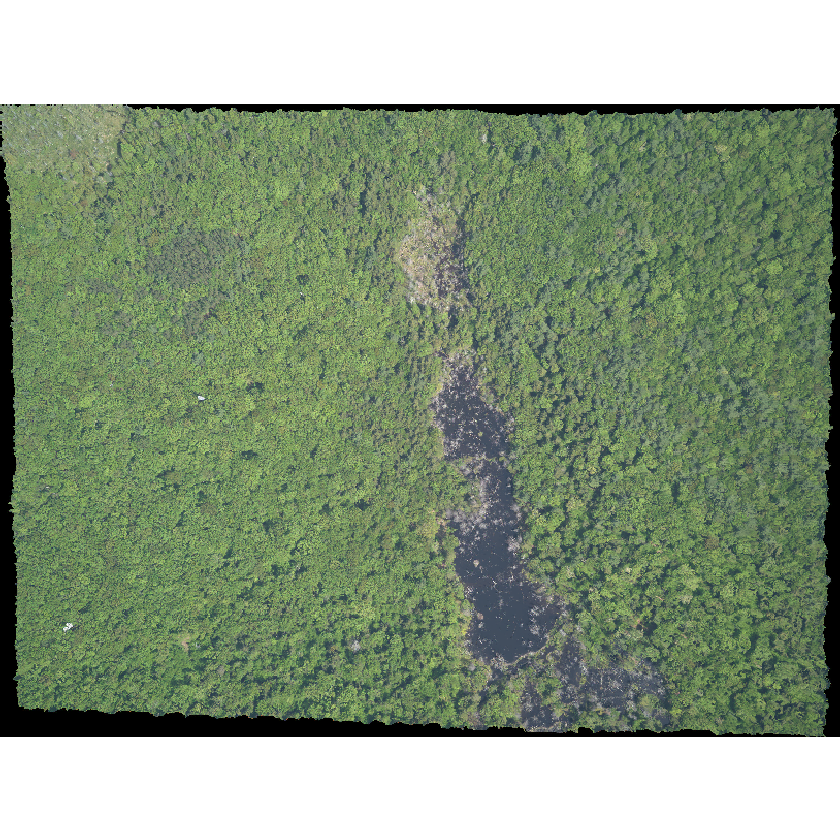

In [33]:
plotRGB(RGB_stack_HARV,
        r = 1, g = 2, b = 3)

### Adjusting contrast and clarity with stretch

We can explore whether applying a stretch to the image might improve clarity and contrast using `stretch="lin"` or `stretch="hist"`.

When the range of pixel brightness values is closer to 0, a darker image is rendered by default. We can stretch the values to extend to the full 0-255 range of potential values to increase the visual contrast of the image.
<br>
<img src="imageStretch_dark.jpg">
<br>
When the range of pixel brightness values is closer to 255, a lighter image is rendered by default. We can stretch the values to extend to the full 0-255 range of potential values to increase the visual contrast of the image.
<br>
<img src="imageStretch_light.jpg">
<br>

Let's plot our data with the `stretch="lin"` setting.
<br>
<div class="use_editor"></div>

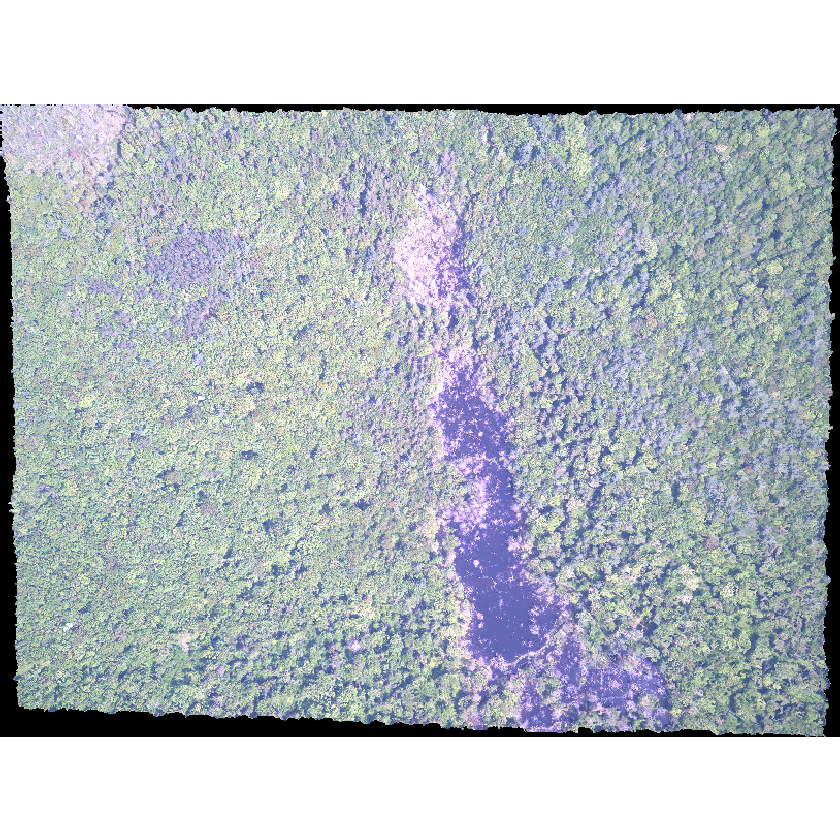

In [34]:
plotRGB(RGB_stack_HARV,
        r = 1, g = 2, b = 3,
        scale = 800,
        stretch = "lin")

Now, let's plot our data with the `stretch="hist"` setting.
<br>
<div class="use_editor"></div>

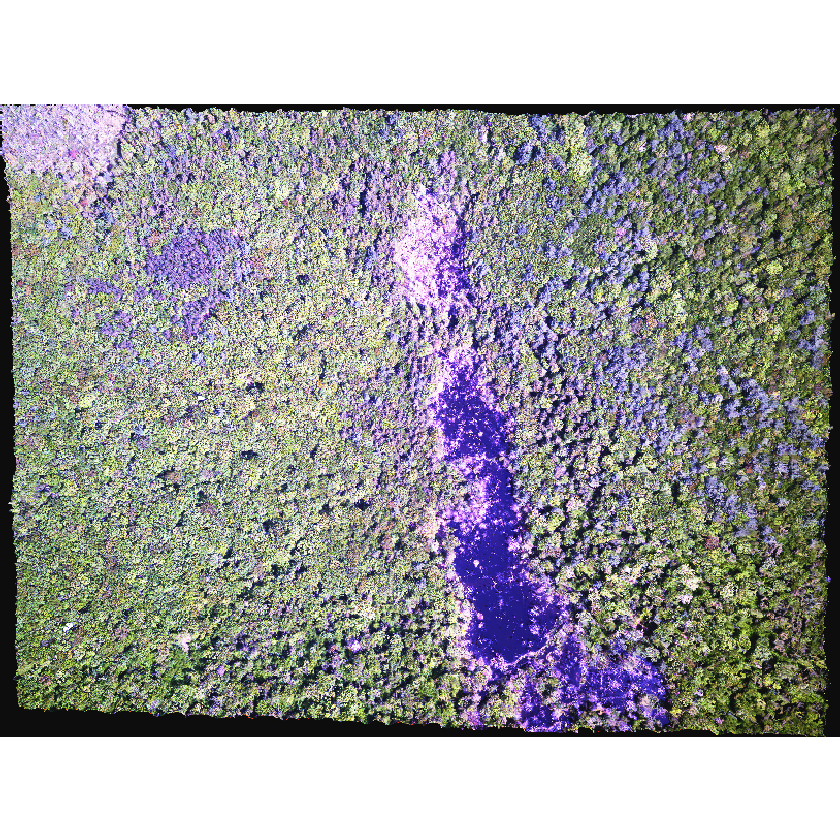

In [35]:
plotRGB(RGB_stack_HARV,
        r = 1, g = 2, b = 3,
        scale = 800,
        stretch = "hist")

What do you notice about each setting?

# RasterStack vs RasterBrick

The R RasterStack and RasterBrick object types can both store multiple bands. However, how they store each band is different. The bands in a RasterStack are stored as links to raster data that is located somewhere on our computer. A RasterBrick contains all of the objects stored within the actual R object. In most cases, we can work with a RasterBrick in the same way we might work with a RasterStack. However a RasterBrick is often more efficient and faster to process - which is important when working with larger files.

We can turn a RasterStack into a RasterBrick in R by using `brick(StackName`. Let’s use the `object.size()` function to compare RasterStack and RasterBrick objects. First we will check the size of our RasterStack object.
<br>
<div class="use_console"></div>

In [36]:
object.size(RGB_stack_HARV)

50104 bytes

Now we will create a RasterBrick object from our RasterStack data and view its size.
<br>
<div class="use_console"></div>

In [38]:
RGB_brick_HARV <- brick(RGB_stack_HARV)

object.size(RGB_brick_HARV)

170898632 bytes

With a RasterBrick, all of the bands are stored within the actual object. Thus, the RasterBrick object size is much larger than the RasterStack object. The plots for both should be the same (since they use the same data. They're just stored differently).
<br>
<div class="use_console"></div>

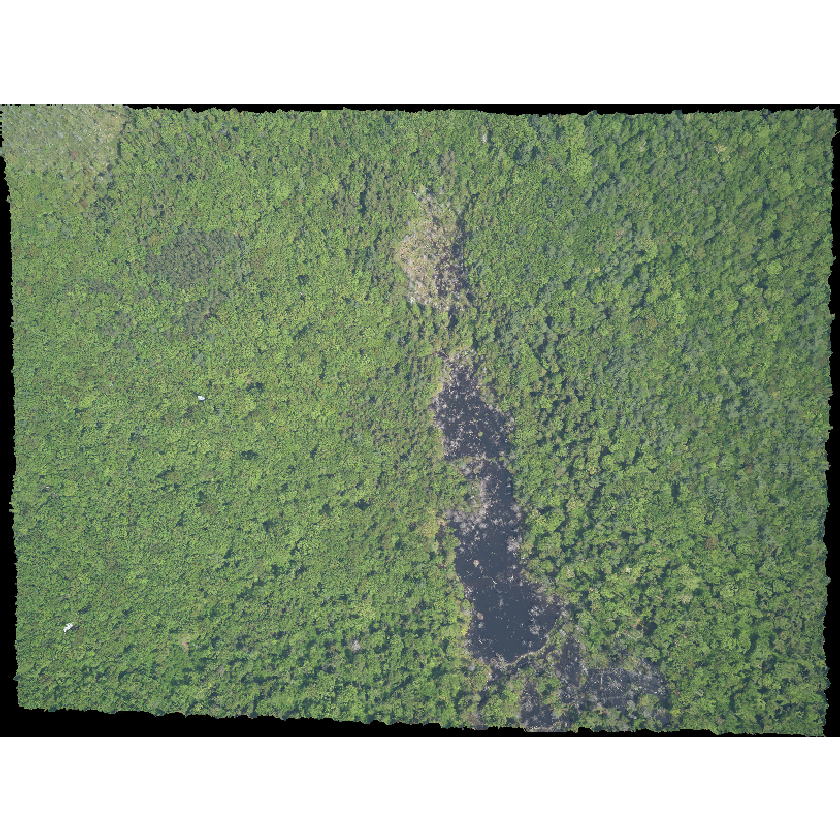

In [39]:
plotRGB(RGB_brick_HARV)

<div class="Q"><br><br>

How is raster data stored? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What raster cell size would result in a smoother, more detailed raster?  
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

Can a single raster file contain multiple layers/bands? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

What function loads all bands in a multi-layer raster file into R? 
 
<br><br><div class="qhelp"></div></div>

<div class="Q"><br><br>

TRUE or FALSE: Individual bands within a stack can be accessed, analyzed, and visualized using the same functions as single bands. 
 
<br><br><div class="qhelp"></div></div>

<div class="big_title">This is the end of lab</div>

*******************
*******************

Code below is for formatting of this lab. Do not alter!

In [ ]:
<span class="important"></span>

<img src="imdbtitle.png">

In [6]:
cssFile <- '../css/custom.css'
IRdisplay::display_html(readChar(cssFile, file.info(cssFile)$size))

IRdisplay::display_html("<style>.Q::before {counter-increment: question_num;
    content: 'QUESTION ' counter(question_num) ': '; white-space: pre; }.T::before {counter-increment: task_num;
    content: 'Task ' counter(task_num) ': ';</style>")